# MANUAL NET ARCHITECTURE

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [3]:
CallMe = 'DATASET/TRAIN/CallMe'
Ok = 'DATASET/TRAIN/Ok'
Rock = 'DATASET/TRAIN/Rock'
ThumbsDown = 'DATASET/TRAIN/ThumbsDown'
ThumbsUp = 'DATASET/TRAIN/ThumbsUp'

In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR CallMe:

======== Images in:  DATASET/TRAIN/CallMe
Images_count :	 1896
Min_width :	 300
Max_width :	 300
Min_height :	 300
Max_height :	 300



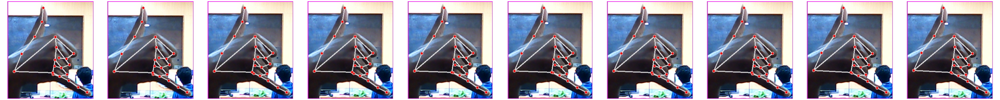

In [5]:
print("")
print("TRAINING DATA FOR CallMe:")
print("")
images_details(CallMe)
print("")
plot_images(CallMe, 10) 


TRAINING DATA FOR Ok:

======== Images in:  DATASET/TRAIN/Ok
Images_count :	 1996
Min_width :	 300
Max_width :	 300
Min_height :	 300
Max_height :	 300



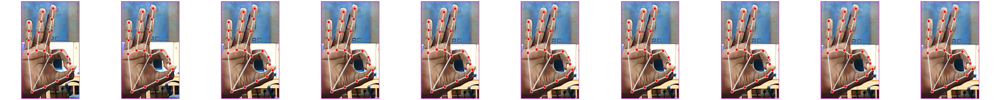

In [6]:
print("")
print("TRAINING DATA FOR Ok:")
print("")
images_details(Ok)
print("")
plot_images(Ok, 10) 


TRAINING DATA FOR ThumbsDown:

======== Images in:  DATASET/TRAIN/ThumbsDown
Images_count :	 1982
Min_width :	 300
Max_width :	 300
Min_height :	 300
Max_height :	 300



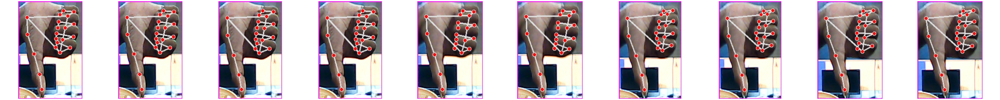

In [7]:
print("")
print("TRAINING DATA FOR ThumbsDown:")
print("")
images_details(ThumbsDown)
print("")
plot_images(ThumbsDown, 10) 


TRAINING DATA FOR Rock:

======== Images in:  DATASET/TRAIN/Rock
Images_count :	 2068
Min_width :	 300
Max_width :	 300
Min_height :	 300
Max_height :	 300



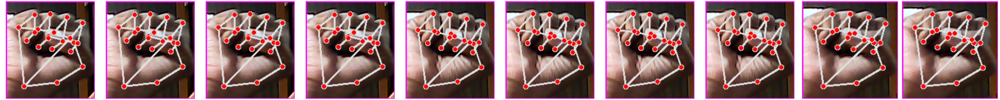

In [8]:
print("")
print("TRAINING DATA FOR Rock:")
print("")
images_details(Rock)
print("")
plot_images(Rock, 10) 


TRAINING DATA FOR ThumbsUp:

======== Images in:  DATASET/TRAIN/ThumbsUp
Images_count :	 2002
Min_width :	 300
Max_width :	 300
Min_height :	 300
Max_height :	 300



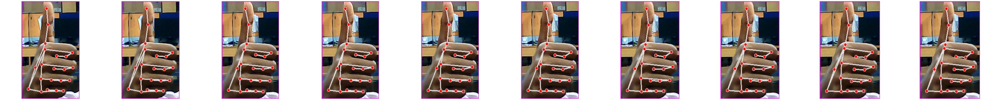

In [9]:
print("")
print("TRAINING DATA FOR ThumbsUp:")
print("")
images_details(ThumbsUp)
print("")
plot_images(ThumbsUp, 10) 

In [10]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('dataset/train',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 9944 images belonging to 5 classes.


In [11]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('dataset/test',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 1500 images belonging to 5 classes.


In [16]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(5, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [17]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [18]:
epochs = 10
batch_size = 512

In [19]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/10
19/19 [==============================] - ETA: 0s - loss: 31.5013 - accuracy: 0.3017
Epoch 1: accuracy improved from -inf to 0.30167, saving model to MANUAL.h5
19/19 [==============================] - 15s 738ms/step - loss: 31.5013 - accuracy: 0.3017 - val_loss: 2.7390 - val_accuracy: 0.3281
Epoch 2/10
19/19 [==============================] - ETA: 0s - loss: 0.9491 - accuracy: 0.6793
Epoch 2: accuracy improved from 0.30167 to 0.67928, saving model to MANUAL.h5
19/19 [==============================] - 14s 729ms/step - loss: 0.9491 - accuracy: 0.6793 - val_loss: 2.1946 - val_accuracy: 0.6406
Epoch 3/10
19/19 [==============================] - ETA: 0s - loss: 0.3774 - accuracy: 0.8865
Epoch 3: accuracy improved from 0.67928 to 0.88651, saving model to MANUAL.h5
19/19 [==============================] - 14s 710ms/step - loss: 0.3774 - accuracy: 0.8865 - val_loss: 0.6824 - val_accuracy: 0.8438
Epoch 4/10
19/19 [==============================] - ETA: 0s - loss: 0.3640 - accuracy: 0.

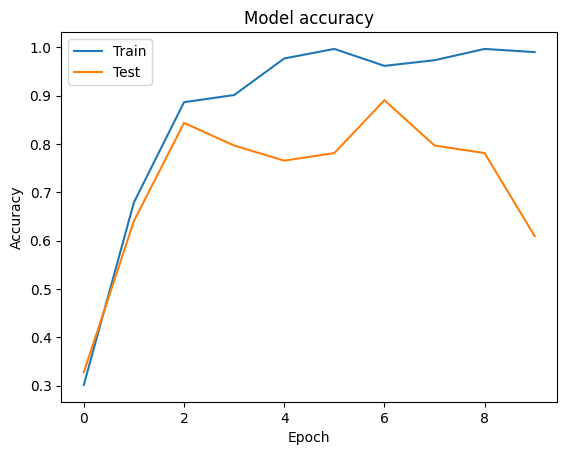

In [20]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

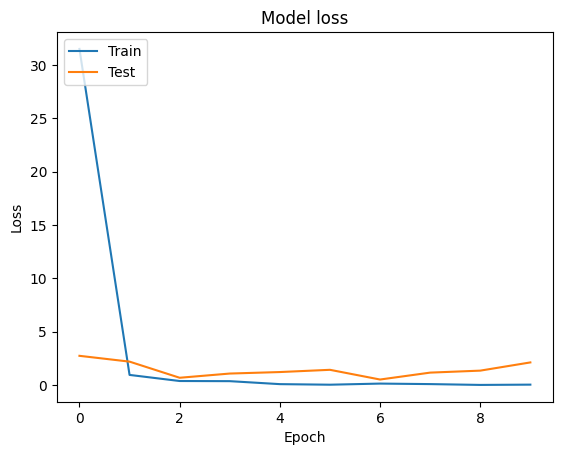

In [21]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()